# 21-1. 프로젝트 : 개선된 U-Net 모델 만들기

U-Net을 통한 시맨틱 세그멘테이션 결과가 충분히 만족스러우신가요? 어느 정도 동작하는 것 같긴 하지만 좀 더 개선할 여지도 보일 것입니다.

2018년에 U-Net++라는 논문이 나왔습니다. 이 논문은 기존에 아주 단순하면서도 세그멘테이션에서 효과를 발휘했던 U-Net의 네트워크 구조에 DenseNet의 아이디어를 가미하여 성능을 개선한 모델입니다. 논문은 2020년에 한 번 업그레이드가 되었네요.

- U-Net++: v1 https://arxiv.org/abs/1807.10165
- U-Net++: v2 https://arxiv.org/abs/1912.05074

모델의 구조 자체는 아래 그림에서 보는 것처럼 별다른 설명이 없이도 직관적으로 이해가 가능한 수준입니다. 오늘 소개되었던 U-Net의 모델 코드를 조금만 수정 확장하면 충분히 구현할 수 있을 것입니다. 그래서 오늘의 과제는 바로 U-Net++ 모델을 스스로의 힘으로 직접 구현해 보고, U-Net을 활용했던 도로 세그멘테이션 태스크에 적용하여 U-Net을 썼을 때보다 성능이 향상되었음을 확인해 보는 것입니다. 정성적으로는 두 모델의 세그멘테이션 결과를 시각화해서 비교해 볼 수 있을 것이고, 정량적으로는 동일 이미지에 대한 IoU 값을 비교해 보면 될 것입니다.

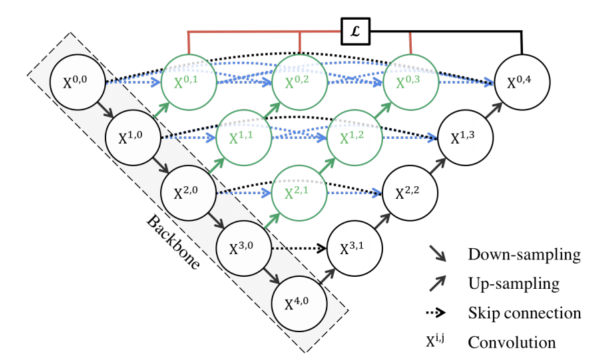
참고할 수 있는 코드는 아래에 있습니다. 다행히도 keras로 구현되어 있습니다.

- U-Net++:Github https://github.com/MrGiovanni/UNetPlusPlus

코드 중에서 가장 중요한 부분도 알려드리자면 여기:build_xnet입니다. 논문에서 제시하는 수식과 함께 참고하세요.
https://github.com/MrGiovanni/UNetPlusPlus/blob/e145ba63862982bf1099cf2ec11d5466b434ae0b/keras/segmentation_models/xnet/builder.py#L12

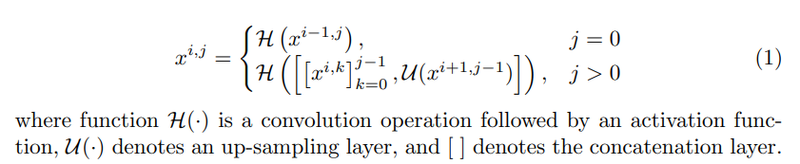  
[H와 u와 []가 무엇인지 주목하세요]
https://arxiv.org/pdf/1807.10165.pdf  

코드 중 up_block으로는 두 가지 방식을 사용하고 있네요. Transpose2D_block https://github.com/MrGiovanni/UNetPlusPlus/blob/e145ba63862982bf1099cf2ec11d5466b434ae0b/keras/segmentation_models/xnet/blocks.py#L53 과 Upsample2D_block https://github.com/MrGiovanni/UNetPlusPlus/blob/e145ba63862982bf1099cf2ec11d5466b434ae0b/keras/segmentation_models/xnet/blocks.py#L28 인데요. 둘 중 어느 것을 사용해도 좋습니다.

또 한 가지 주의해야 할 점은 Loss를 조금 다르게 구현해야 한다는 점입니다. binary cross-entropy와 dice coefficient를 사용한다고 하는데요. dice_coef에 구현된 dice coefficient https://github.com/MrGiovanni/UNetPlusPlus/blob/e145ba63862982bf1099cf2ec11d5466b434ae0b/keras/helper_functions.py#L37 를 참고해 보세요.

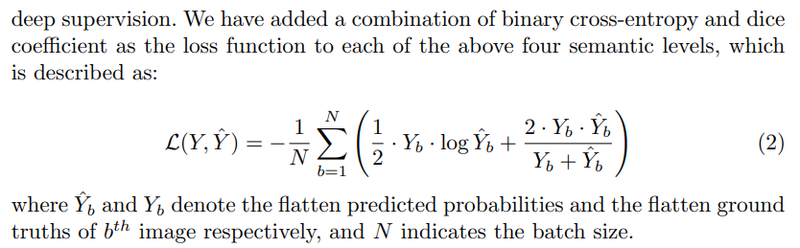
[binary cross-entropy와 dice coefficient를 이용합니다]
https://arxiv.org/pdf/1807.10165.pdf  

프로젝트 진행에 필요한 주요 라이브러리 버전 체크를 해봅시다.

In [1]:
import tensorflow as tf
import numpy as np
import PIL
import skimage
import albumentations

print(tf.__version__)
print(np.__version__)
print(PIL.__version__)
print(skimage.__version__)
print(albumentations.__version__)

2.6.0
1.21.4
8.3.2
0.18.3
1.1.0


In [2]:
#필요한 라이브러리를 로드합니다. 
import os
import math

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

### Step 1. KITTI 데이터셋 수집과 구축

다운로드한 KITTI 데이터에 data augmentation을 적용한 형태로 데이터셋을 구축합니다. 이때 주의할 점이 있습니다. U-Net++는 메모리 사용량이 U-Net보다 꽤 많아집니다. 그러니 배치 사이즈를 적절히 줄여서 설정하시기를 권합니다.

In [3]:
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

def build_augmentation(is_train=True):
    if is_train:    # 훈련용 데이터일 경우
        return Compose([
                        HorizontalFlip(p=0.5),    # 50%의 확률로 좌우대칭
                        RandomSizedCrop(         # 50%의 확률로 RandomSizedCrop
                            min_max_height=(300, 370),
                            w2h_ratio=370/1242,
                            height=224,
                            width=224,
                            p=0.5
                            ),
                        Resize(              # 입력이미지를 224X224로 resize
                            width=224,
                            height=224
                            )
                        ])
    return Compose([      # 테스트용 데이터일 경우에는 224X224로 resize만 수행합니다. 
                Resize(
                    width=224,
                    height=224
                    )
                ])

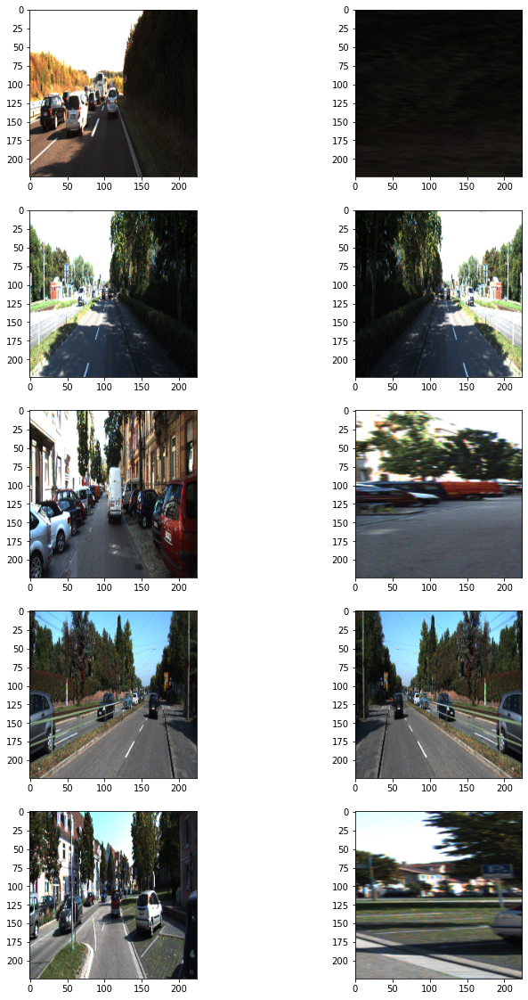

In [4]:
dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'

augmentation_train = build_augmentation()
augmentation_test = build_augmentation(is_train=False)
input_images = glob(os.path.join(dir_path, "image_2", "*.png"))

# 훈련 데이터셋에서 5개만 가져와 augmentation을 적용해 봅시다.  
plt.figure(figsize=(12, 20))
for i in range(5):
    image = imread(input_images[i]) 
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지

plt.show()

### 데이터셋 구성

In [5]:
class KittiGenerator(tf.keras.utils.Sequence):
    '''
    KittiGenerator는 tf.keras.utils.Sequence를 상속받습니다.
    우리가 KittiDataset을 원하는 방식으로 preprocess하기 위해서 Sequnce를 커스텀해 사용합니다.
    '''
    def __init__(self,
                 dir_path,
                 batch_size=8, # batch size 16 -> 8 로 수정
                 img_size=(224, 224, 3),
                 output_size=(224, 224),
                 is_train=True,
                 augmentation=None):
        '''
        dir_path: dataset의 directory path입니다.
        batch_size: batch_size입니다.
        img_size: preprocess에 사용할 입력이미지의 크기입니다.
        output_size: ground_truth를 만들어주기 위한 크기입니다.
        is_train: 이 Generator가 학습용인지 테스트용인지 구분합니다.
        augmentation: 적용하길 원하는 augmentation 함수를 인자로 받습니다.
        '''
        self.dir_path = dir_path
        self.batch_size = batch_size
        self.is_train = is_train
        self.dir_path = dir_path
        self.augmentation = augmentation
        self.img_size = img_size
        self.output_size = output_size

        # load_dataset()을 통해서 kitti dataset의 directory path에서 라벨과 이미지를 확인합니다.
        self.data = self.load_dataset()

    def load_dataset(self):
        # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수입니다.
        # 이때 is_train에 따라 test set을 분리해서 load하도록 해야합니다.
        input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
        label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
        input_images.sort()
        label_images.sort()
        assert len(input_images) == len(label_images)
        data = [ _ for _ in zip(input_images, label_images)]

        if self.is_train:
            return data[:-30]
        return data[-30:]

    def __len__(self):
        # Generator의 length로서 전체 dataset을 batch_size로 나누고 소숫점 첫째자리에서 올림한 값을 반환합니다.
        return math.ceil(len(self.data) / self.batch_size)

    def __getitem__(self, index):
        # 입력과 출력을 만듭니다.
        # 입력은 resize및 augmentation이 적용된 input image이고 
        # 출력은 semantic label입니다.
        batch_data = self.data[
                        index*self.batch_size:
                        (index + 1)*self.batch_size
                        ]
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])

        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = imread(output_path)
            _output = (_output==7).astype(np.uint8)*1
            data = {
              "image": _input,
              "mask": _output,
            }
            augmented = self.augmentation(**data)
            inputs[i] = augmented["image"]/255
            outputs[i] = augmented["mask"]
            return inputs, outputs

    def on_epoch_end(self):
        # 한 epoch가 끝나면 실행되는 함수입니다. 학습중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있습니다.
        self.indexes = np.arange(len(self.data))
        if self.is_train == True :
            np.random.shuffle(self.indexes)
        return self.indexes

In [6]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

### Step 2. U-Net++ 모델의 구현

U-Net의 모델 구조와 소스코드를 면밀히 비교해 보다 보면, U-Net++를 어떻게 구현할 수 있을지에 대한 방안을 떠올릴 수 있을 것입니다. 이 과정을 통해 U-Net 자체에 대한 이해도도 증진될 것입니다. 그 외 적절히 U-Net의 백본 구조, 기타 파라미터 변경 등을 통해 추가적인 성능 향상이 가능할 수도 있습니다.

### U-Net 모델 구현

In [7]:
def build_unet_model(input_shape=(224, 224, 3)):
    """
    U-Net 모델 구축 함수 (binary_crossentropy에 맞게 수정)

    Parameters:
        input_shape (tuple): 입력 이미지의 크기 (H, W, C)
    
    Returns:
        model (tf.keras.Model): U-Net 모델
    """
    inputs = Input(input_shape)
    
    # Contracting Path (Encoder)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = MaxPooling2D((2, 2))(c4)
    
    # Bottleneck
    b = Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    b = Conv2D(1024, (3, 3), activation='relu', padding='same')(b)
    
    # Expansive Path (Decoder)
    u5 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(b)
    u5 = concatenate([u5, c4])
    c5 = Conv2D(512, (3, 3), activation='relu', padding='same')(u5)
    c5 = Conv2D(512, (3, 3), activation='relu', padding='same')(c5)
    
    u6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c3])
    c6 = Conv2D(256, (3, 3), activation='relu', padding='same')(u6)
    c6 = Conv2D(256, (3, 3), activation='relu', padding='same')(c6)
    
    u7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c2])
    c7 = Conv2D(128, (3, 3), activation='relu', padding='same')(u7)
    c7 = Conv2D(128, (3, 3), activation='relu', padding='same')(c7)
    
    u8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c1])
    c8 = Conv2D(64, (3, 3), activation='relu', padding='same')(u8)
    c8 = Conv2D(64, (3, 3), activation='relu', padding='same')(c8)
    
    # 최종 출력 레이어 (이진 분류를 위해 채널 수 = 1, sigmoid 활성화)
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c8)
    
    model = Model(inputs=[inputs], outputs=[outputs])
    
    return model

### 3 epoch 학습 확인 후 기존 학습된 모델 사용함

In [8]:
model_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet.h5'

In [9]:
unet_model = build_unet_model()
unet_model.compile(optimizer = Adam(1e-4), loss = 'binary_crossentropy')

In [10]:
unet_history = unet_model.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs= 3 # 100,
 )

unet_model.save(model_path)  #학습한 모델을 저장해 주세요.

Epoch 1/3
22/22 [==============================] - 21s 386ms/step - loss: 0.6745 - val_loss: 0.6017
Epoch 2/3
22/22 [==============================] - 8s 384ms/step - loss: 0.2194 - val_loss: 0.0694
Epoch 3/3
22/22 [==============================] - 9s 391ms/step - loss: 0.0892 - val_loss: 0.0668


In [11]:
def plot_training_history(history):
    """
    모델 학습 기록(history)에서 손실(loss) 및 검증 손실(validation loss)을 시각화합니다.

    Parameters:
        history (tf.keras.callbacks.History): model.fit()의 반환값
    
    Returns:
        None
    """
    # 히스토리에서 손실 및 검증 손실 추출
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(loss) + 1)  # 에포크 범위

    # 그래프 그리기
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, loss, 'b-', label='Training Loss')  # 훈련 손실 (파란색 실선)
    plt.plot(epochs, val_loss, 'r-', label='Validation Loss')  # 검증 손실 (빨간색 실선)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

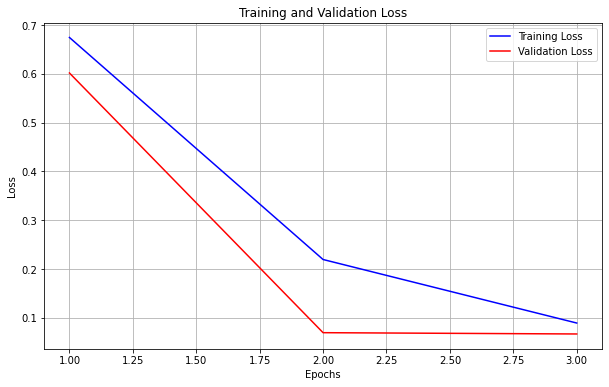

In [12]:
# 손실 그래프 그리기
plot_training_history(unet_history)

### 사전 학습된 모델 사용

In [13]:
# 미리 준비한 모델을 불러오려면 아래 주석을 해제하세요
model_path = dir_path + '/seg_model_unet.h5' 

unet_model = tf.keras.models.load_model(model_path)

In [14]:
def get_output(model, preproc, image_path, output_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()
    return output

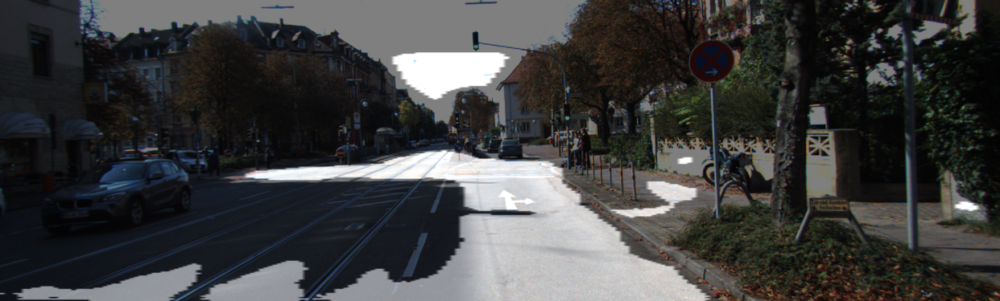

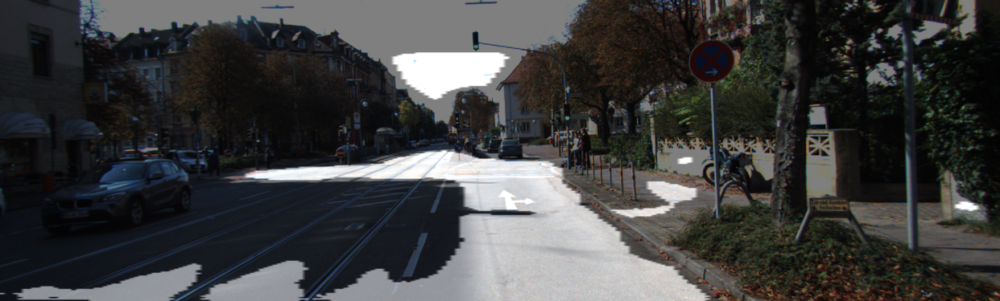

In [15]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
get_output(
     unet_model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

### IoU 계산 함수

In [16]:
def calculate_iou_score(target, prediction):
    """
    IoU (Intersection over Union) 점수를 계산합니다.

    Parameters:
        target (np.ndarray): 실제 레이블 이미지 (binary mask: 0 또는 1)
        prediction (np.ndarray): 예측된 레이블 이미지 (binary mask: 0 또는 1)

    Returns:
        float: IoU 점수
    """
    # Intersection (교집합): target과 prediction 모두 1인 부분
    intersection = np.logical_and(target, prediction).sum()
    
    # Union (합집합): target과 prediction 중 하나라도 1인 부분
    union = np.logical_or(target, prediction).sum()
    
    # IoU Score 계산
    iou_score = float(intersection) / float(union) if union != 0 else 0.0
    print('IoU : %f' % iou_score )
    return iou_score

### 시각화 함수 확장

In [17]:
def get_output(model, preproc, image_path, output_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _

### U-Net++ 모델의 구현

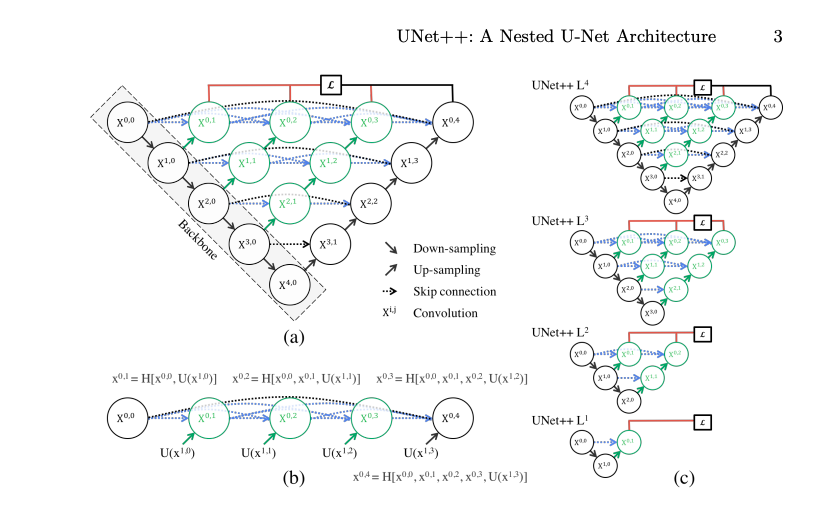

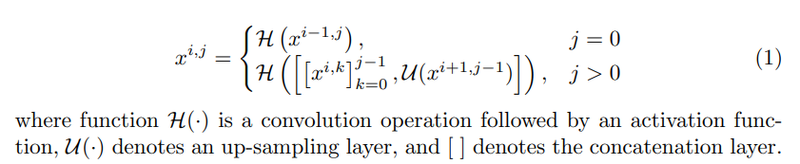

- $\mathcal{H}$: Convolution 연산 + 활성화 함수, **Conv2D**와 **ReLU**로 구성 
- $\mathcal{U}$: Upsampling 연산, **Conv2DTranspose**를 사용하여 이미지의 해상도를 증가  
- $[ \ ]$: Concatenation 연산, **Skip Connection**과 **Upsampling된 출력**을 연결  

In [18]:
# def build_unet_2plus_model(input_shape=(224, 224, 3)):
#     """
#     U-Net++ 모델 구축 함수 (binary_crossentropy + dice coefficient)
    
#     Parameters:
#         input_shape (tuple): 입력 이미지의 크기 (H, W, C)
    
#     Returns:
#         model (tf.keras.Model): U-Net++ 모델
#     """
#     inputs = Input(input_shape)
    
#     # -----------------------
#     # Backbone (Down-Sampling)
#     # -----------------------
#     x_0_0 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
#     x_0_0 = Conv2D(64, (3, 3), activation='relu', padding='same')(x_0_0)
#     x_1_0 = MaxPooling2D((2, 2))(x_0_0)
    
#     x_1_0 = Conv2D(128, (3, 3), activation='relu', padding='same')(x_1_0)
#     x_1_0 = Conv2D(128, (3, 3), activation='relu', padding='same')(x_1_0)
#     x_2_0 = MaxPooling2D((2, 2))(x_1_0)
    
#     x_2_0 = Conv2D(256, (3, 3), activation='relu', padding='same')(x_2_0)
#     x_2_0 = Conv2D(256, (3, 3), activation='relu', padding='same')(x_2_0)
#     x_3_0 = MaxPooling2D((2, 2))(x_2_0)
    
#     x_3_0 = Conv2D(512, (3, 3), activation='relu', padding='same')(x_3_0)
#     x_3_0 = Conv2D(512, (3, 3), activation='relu', padding='same')(x_3_0)
#     x_4_0 = MaxPooling2D((2, 2))(x_3_0)
    
#     x_4_0 = Conv2D(1024, (3, 3), activation='relu', padding='same')(x_4_0)
#     x_4_0 = Conv2D(1024, (3, 3), activation='relu', padding='same')(x_4_0)
    
#     # -----------------------
#     # Up-Sampling Path (Nested Decoder)
#     # -----------------------
#     x_0_1 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x_1_0)
#     x_0_1 = concatenate([x_0_1, x_0_0])
#     x_0_1 = Conv2D(64, (3, 3), activation='relu', padding='same')(x_0_1)
    
#     x_1_1 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(x_2_0)
#     x_1_1 = concatenate([x_1_1, x_1_0])
#     x_1_1 = Conv2D(128, (3, 3), activation='relu', padding='same')(x_1_1)
    
#     x_0_2 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x_1_1)
#     x_0_2 = concatenate([x_0_2, x_0_0, x_0_1])
#     x_0_2 = Conv2D(64, (3, 3), activation='relu', padding='same')(x_0_2)
    
#     x_2_1 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(x_3_0)
#     x_2_1 = concatenate([x_2_1, x_2_0])
#     x_2_1 = Conv2D(256, (3, 3), activation='relu', padding='same')(x_2_1)
    
#     x_1_2 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(x_2_1)
#     x_1_2 = concatenate([x_1_2, x_1_0, x_1_1])
#     x_1_2 = Conv2D(128, (3, 3), activation='relu', padding='same')(x_1_2)
    
#     x_0_3 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x_1_2)
#     x_0_3 = concatenate([x_0_3, x_0_0, x_0_1, x_0_2])
#     x_0_3 = Conv2D(64, (3, 3), activation='relu', padding='same')(x_0_3)
    
#     x_3_1 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(x_4_0)
#     x_3_1 = concatenate([x_3_1, x_3_0])
#     x_3_1 = Conv2D(512, (3, 3), activation='relu', padding='same')(x_3_1)
    
#     x_2_2 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(x_3_1)
#     x_2_2 = concatenate([x_2_2, x_2_0, x_2_1])
#     x_2_2 = Conv2D(256, (3, 3), activation='relu', padding='same')(x_2_2)
    
#     x_1_3 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(x_2_2)
#     x_1_3 = concatenate([x_1_3, x_1_0, x_1_1, x_1_2])
#     x_1_3 = Conv2D(128, (3, 3), activation='relu', padding='same')(x_1_3)
    
#     x_0_4 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x_1_3)
#     x_0_4 = concatenate([x_0_4, x_0_0, x_0_1, x_0_2, x_0_3])
#     x_0_4 = Conv2D(64, (3, 3), activation='relu', padding='same')(x_0_4)
    
#     # -----------------------
#     # 최종 출력
#     # -----------------------
#     outputs = Conv2D(1, (1, 1), activation='sigmoid')(x_0_4)
    
#     model = Model(inputs=[inputs], outputs=[outputs])
#     return model

### conv_block 함수화
- 추가 실험 : BatchNormalization, dropout 사용 추가함

In [19]:
def conv_block(x, filters, dropout_rate=0.1):
    """Convolutional Block"""
    x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    if dropout_rate > 0:
        x = Dropout(dropout_rate)(x)
    return x

### up_block 함수화

In [21]:
def up_block(x, skip_connections, filters):
    """
    업샘플링 및 스킵 연결 블록
    
    Parameters:
        x (tf.Tensor): 업샘플링 텐서
        skip_connections (list or tf.Tensor): 스킵 연결 텐서
        filters (int): 필터 수
    
    Returns:
        tf.Tensor: 업샘플링된 결과 텐서
    """
    x = Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding='same')(x)
    
    if isinstance(skip_connections, list):
        x = concatenate(skip_connections + [x], axis=-1)
    else:
        x = concatenate([x, skip_connections], axis=-1)
    
    x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    return x

In [22]:
# U-Net++ 모델 정의
def build_unet_2plus_model(input_shape=(224, 224, 3)):
    """
    U-Net++ 모델 구축 함수 (binary_crossentropy + dice coefficient)
    
    Parameters:
        input_shape (tuple): 입력 이미지의 크기 (H, W, C)
    
    Returns:
        model (tf.keras.Model): U-Net++ 모델
    """
    inputs = Input(input_shape)
    
    # -----------------------
    # Encoder (Down-Sampling Path)
    # -----------------------
    x_0_0 = conv_block(inputs, 64)  # Level 0
    x_1_0 = conv_block(MaxPooling2D((2, 2))(x_0_0), 128)  # Level 1
    x_2_0 = conv_block(MaxPooling2D((2, 2))(x_1_0), 256)  # Level 2
    x_3_0 = conv_block(MaxPooling2D((2, 2))(x_2_0), 512)  # Level 3
    x_4_0 = conv_block(MaxPooling2D((2, 2))(x_3_0), 1024)  # Level 4
    
    # -----------------------
    # Decoder (Nested Path with Skip Connections)
    # -----------------------
    # Level 1
    x_0_1 = up_block(x_1_0, [x_0_0], 64)  
    
    # Level 2
    x_1_1 = up_block(x_2_0, [x_1_0], 128)
    x_0_2 = up_block(x_1_1, [x_0_0, x_0_1], 64)
    
    # Level 3
    x_2_1 = up_block(x_3_0, [x_2_0], 256)
    x_1_2 = up_block(x_2_1, [x_1_0, x_1_1], 128)
    x_0_3 = up_block(x_1_2, [x_0_0, x_0_1, x_0_2], 64)
    
    # Level 4
    x_3_1 = up_block(x_4_0, [x_3_0], 512)
    x_2_2 = up_block(x_3_1, [x_2_0, x_2_1], 256)
    x_1_3 = up_block(x_2_2, [x_1_0, x_1_1, x_1_2], 128)
    x_0_4 = up_block(x_1_3, [x_0_0, x_0_1, x_0_2, x_0_3], 64)
    
    # -----------------------
    # output 레이어
    # -----------------------
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(x_0_4)
    
    model = Model(inputs=[inputs], outputs=[outputs])
    
    return model

In [23]:
import tensorflow.keras.backend as K

### Loss 구현

In [24]:
def dice_coefficient(y_true, y_pred):
    smooth = 1.0
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2.0 * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

def combined_loss(y_true, y_pred):
    return K.binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

In [42]:
unet_2plus_model = build_unet_2plus_model()
unet_2plus_model.compile(optimizer = Adam(1e-4), 
                         loss = combined_loss, 
                         metrics=[dice_coefficient]
                        )

unet_2plus_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_81 (Conv2D)              (None, 224, 224, 64) 1792        input_4[0][0]                    
__________________________________________________________________________________________________
batch_normalization_20 (BatchNo (None, 224, 224, 64) 256         conv2d_81[0][0]                  
__________________________________________________________________________________________________
conv2d_82 (Conv2D)              (None, 224, 224, 64) 36928       batch_normalization_20[0][0]     
____________________________________________________________________________________________

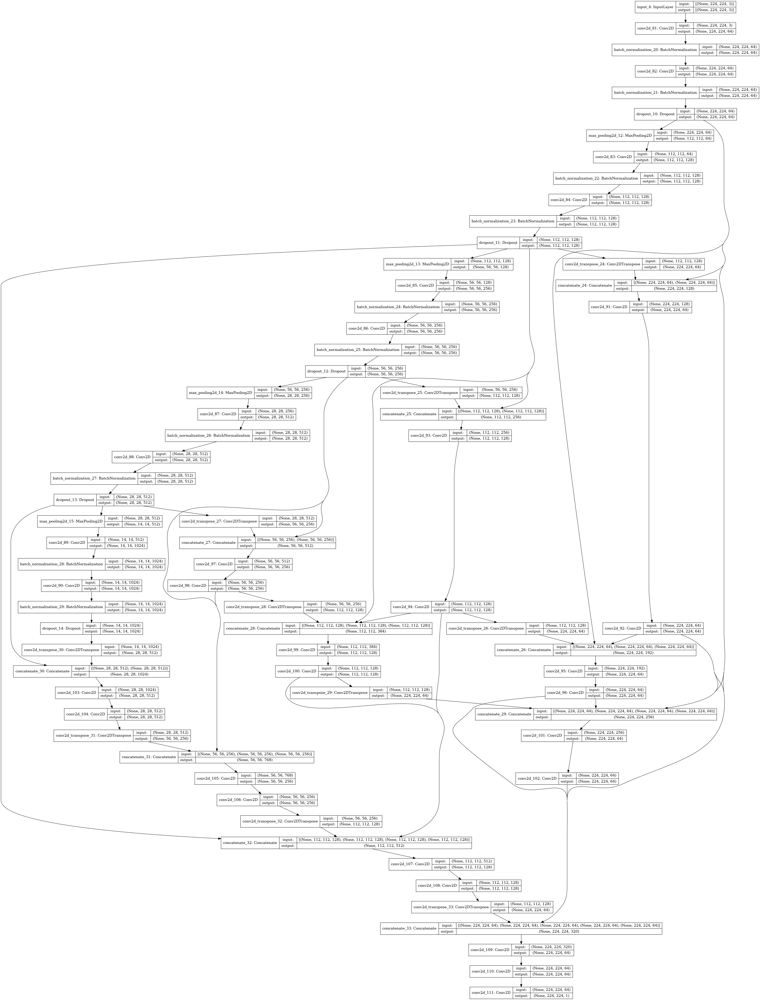

In [43]:
from tensorflow.keras.utils import plot_model

plot_model(unet_2plus_model, show_shapes=True, expand_nested=True, to_file='unet_2plus_model.png')

In [44]:
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import Callback, ModelCheckpoint
import pickle
import os

### best 모델 save callback

In [45]:
unet_2plus_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet_2plus_best_2th.h5'

# ModelCheckpoint 콜백 설정
checkpoint = ModelCheckpoint(
    filepath=unet_2plus_path,
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

### History 저장을 위한 사용자 정의 Callback

In [46]:
history_path = os.getenv('HOME') + '/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl'

class SaveHistoryCallback(Callback):
    def __init__(self, history_path):
        super(SaveHistoryCallback, self).__init__()
        self.history_path = history_path

    def on_epoch_end(self, epoch, logs=None):
        # logs는 현재 epoch의 메트릭 정보
        if logs is None:
            logs = {}
        history = self.model.history.history  # 모델의 history 정보 가져오기
        
        # 현재까지의 history를 저장
        with open(self.history_path, 'wb') as f:
            pickle.dump(history, f)
        print(f"\nHistory saved at epoch {epoch + 1} to {self.history_path}")
        
# SaveHistoryCallback 콜백 설정 (Epoch마다 history 저장)
save_history = SaveHistoryCallback(history_path)

### U-Net++ 모델 학습
- epochs = 200 으로 확장 하여 재실험

In [47]:
# 모델 학습
unet_2plus_history = unet_2plus_model.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=200,
     callbacks=[checkpoint, save_history]  # 두 콜백 추가
)

print(f"\nHistory and best model are being saved at each epoch.")

Epoch 1/200
22/22 [==============================] - 25s 1s/step - loss: 0.9100 - dice_coefficient: 0.2741 - val_loss: 1.3129 - val_dice_coefficient: 0.0086

Epoch 00001: val_loss improved from inf to 1.31287, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_2plus_best_2th.h5

History saved at epoch 1 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 2/200
22/22 [==============================] - 23s 1s/step - loss: 0.5505 - dice_coefficient: 0.5263 - val_loss: 1.4938 - val_dice_coefficient: 0.0022

Epoch 00002: val_loss did not improve from 1.31287

History saved at epoch 2 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 3/200
22/22 [==============================] - 22s 995ms/step - loss: 0.4968 - dice_coefficient: 0.5862 - val_loss: 1.4143 - val_dice_coefficient: 0.0047

Epoch 00003: val_loss did not improve from 1.31287

History saved at epoch 3 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoc

22/22 [==============================] - 22s 992ms/step - loss: 0.3265 - dice_coefficient: 0.7082 - val_loss: 0.4593 - val_dice_coefficient: 0.6165

Epoch 00025: val_loss did not improve from 0.42753

History saved at epoch 25 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 26/200
22/22 [==============================] - 22s 994ms/step - loss: 0.3822 - dice_coefficient: 0.6447 - val_loss: 0.4394 - val_dice_coefficient: 0.6401

Epoch 00026: val_loss did not improve from 0.42753

History saved at epoch 26 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 27/200
22/22 [==============================] - 22s 994ms/step - loss: 0.2055 - dice_coefficient: 0.8228 - val_loss: 0.3752 - val_dice_coefficient: 0.6859

Epoch 00027: val_loss improved from 0.42753 to 0.37521, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_2plus_best_2th.h5

History saved at epoch 27 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
E

22/22 [==============================] - 22s 993ms/step - loss: 0.2330 - dice_coefficient: 0.7998 - val_loss: 0.1469 - val_dice_coefficient: 0.8919

Epoch 00050: val_loss did not improve from 0.14479

History saved at epoch 50 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 51/200
22/22 [==============================] - 22s 994ms/step - loss: 0.2853 - dice_coefficient: 0.7560 - val_loss: 0.2205 - val_dice_coefficient: 0.8223

Epoch 00051: val_loss did not improve from 0.14479

History saved at epoch 51 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 52/200
22/22 [==============================] - 22s 992ms/step - loss: 0.1880 - dice_coefficient: 0.8454 - val_loss: 0.2406 - val_dice_coefficient: 0.8246

Epoch 00052: val_loss did not improve from 0.14479

History saved at epoch 52 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 53/200
22/22 [==============================] - 22s 991ms/step - loss: 0.1757 - dice_c


Epoch 00076: val_loss did not improve from 0.12527

History saved at epoch 76 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 77/200
22/22 [==============================] - 21s 935ms/step - loss: 0.3683 - dice_coefficient: 0.6657 - val_loss: 0.2275 - val_dice_coefficient: 0.8301

Epoch 00077: val_loss did not improve from 0.12527

History saved at epoch 77 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 78/200
22/22 [==============================] - 20s 933ms/step - loss: 0.3550 - dice_coefficient: 0.6962 - val_loss: 0.3136 - val_dice_coefficient: 0.7781

Epoch 00078: val_loss did not improve from 0.12527

History saved at epoch 78 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 79/200
22/22 [==============================] - 21s 936ms/step - loss: 0.3074 - dice_coefficient: 0.7416 - val_loss: 0.3377 - val_dice_coefficient: 0.7785

Epoch 00079: val_loss did not improve from 0.12527

History saved at epoch 79 

22/22 [==============================] - 20s 932ms/step - loss: 0.1983 - dice_coefficient: 0.8402 - val_loss: 0.1965 - val_dice_coefficient: 0.8671

Epoch 00103: val_loss did not improve from 0.12527

History saved at epoch 103 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 104/200
22/22 [==============================] - 21s 934ms/step - loss: 0.2884 - dice_coefficient: 0.7432 - val_loss: 0.1861 - val_dice_coefficient: 0.8650

Epoch 00104: val_loss did not improve from 0.12527

History saved at epoch 104 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 105/200
22/22 [==============================] - 21s 940ms/step - loss: 0.2192 - dice_coefficient: 0.8218 - val_loss: 0.2007 - val_dice_coefficient: 0.8483

Epoch 00105: val_loss did not improve from 0.12527

History saved at epoch 105 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 106/200
22/22 [==============================] - 21s 934ms/step - loss: 0.1628 - 

22/22 [==============================] - 22s 981ms/step - loss: 0.3065 - dice_coefficient: 0.7635 - val_loss: 0.5732 - val_dice_coefficient: 0.6112

Epoch 00130: val_loss did not improve from 0.12527

History saved at epoch 130 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 131/200
22/22 [==============================] - 22s 981ms/step - loss: 0.4036 - dice_coefficient: 0.6432 - val_loss: 0.2500 - val_dice_coefficient: 0.8087

Epoch 00131: val_loss did not improve from 0.12527

History saved at epoch 131 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 132/200
22/22 [==============================] - 22s 979ms/step - loss: 0.3091 - dice_coefficient: 0.7198 - val_loss: 0.1910 - val_dice_coefficient: 0.8540

Epoch 00132: val_loss did not improve from 0.12527

History saved at epoch 132 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 133/200
22/22 [==============================] - 22s 984ms/step - loss: 0.3036 - 

22/22 [==============================] - 21s 978ms/step - loss: 0.2922 - dice_coefficient: 0.7518 - val_loss: 0.2659 - val_dice_coefficient: 0.8021

Epoch 00157: val_loss did not improve from 0.12527

History saved at epoch 157 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 158/200
22/22 [==============================] - 21s 959ms/step - loss: 0.2456 - dice_coefficient: 0.7753 - val_loss: 0.2061 - val_dice_coefficient: 0.8673

Epoch 00158: val_loss did not improve from 0.12527

History saved at epoch 158 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 159/200
22/22 [==============================] - 21s 938ms/step - loss: 0.2540 - dice_coefficient: 0.7869 - val_loss: 0.2042 - val_dice_coefficient: 0.8601

Epoch 00159: val_loss did not improve from 0.12527

History saved at epoch 159 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 160/200
22/22 [==============================] - 21s 937ms/step - loss: 0.2111 - 

22/22 [==============================] - 20s 928ms/step - loss: 0.1845 - dice_coefficient: 0.8306 - val_loss: 0.1781 - val_dice_coefficient: 0.8695

Epoch 00184: val_loss did not improve from 0.12527

History saved at epoch 184 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 185/200
22/22 [==============================] - 20s 927ms/step - loss: 0.2578 - dice_coefficient: 0.7754 - val_loss: 0.2079 - val_dice_coefficient: 0.8513

Epoch 00185: val_loss did not improve from 0.12527

History saved at epoch 185 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 186/200
22/22 [==============================] - 20s 927ms/step - loss: 0.2289 - dice_coefficient: 0.7945 - val_loss: 0.3297 - val_dice_coefficient: 0.7731

Epoch 00186: val_loss did not improve from 0.12527

History saved at epoch 186 to /aiffel/aiffel/semantic_segmentation/unet_2plus_history_2th.pkl
Epoch 187/200
22/22 [==============================] - 20s 927ms/step - loss: 0.2678 - 

In [48]:
with open(history_path, 'rb') as f:
    loaded_history = pickle.load(f)

print("History successfully loaded!")

History successfully loaded!


In [49]:
def plot_history(history):
    # Training & Validation Loss
    plt.figure(figsize=(12, 5))
    
    # Loss Plot
    plt.subplot(1, 2, 1)
    plt.plot(history['loss'], label='Training Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    # Dice Coefficient Plot
    if 'dice_coefficient' in history:
        plt.subplot(1, 2, 2)
        plt.plot(history['dice_coefficient'], label='Training Dice Coefficient')
        plt.plot(history['val_dice_coefficient'], label='Validation Dice Coefficient')
        plt.title('Training and Validation Dice Coefficient')
        plt.xlabel('Epochs')
        plt.ylabel('Dice Coefficient')
        plt.legend()
    
    plt.tight_layout()
    plt.show()

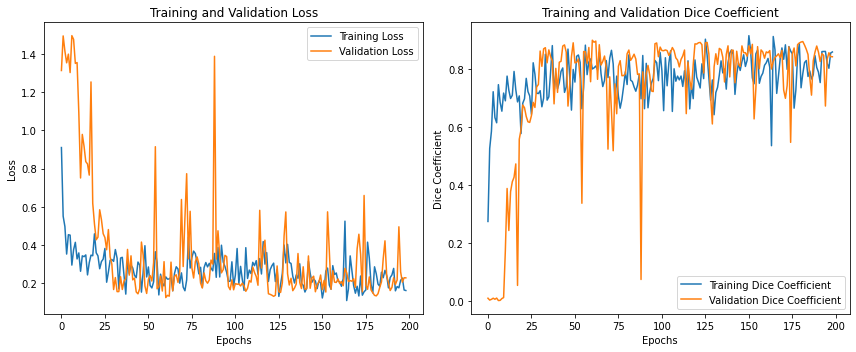

In [50]:
# 불러온 history로 그래프 그리기
plot_history(loaded_history)

In [51]:
# 최적 모델 불러오기
unet_2plus_best_model = load_model(unet_2plus_path, custom_objects={'dice_coefficient': dice_coefficient, 'combined_loss': combined_loss})

# 모델 평가
loss, dice = unet_2plus_best_model.evaluate(test_generator)
print(f"Best Model Loss: {loss}, Dice Coefficient: {dice}")

4/4 [==============================] - 2s 304ms/step - loss: 0.1253 - dice_coefficient: 0.9008
Best Model Loss: 0.12527479231357574, Dice Coefficient: 0.9007672071456909


### Step 3. U-Net 과 U-Net++ 모델이 수행한 세그멘테이션 결과 분석
두 모델의 정량적, 정성적 성능을 비교해 봅시다. 시각화, IoU 계산 등을 체계적으로 시도해 보면 차이를 발견하실 수 있을 것입니다.

### U-Net 모델 결과

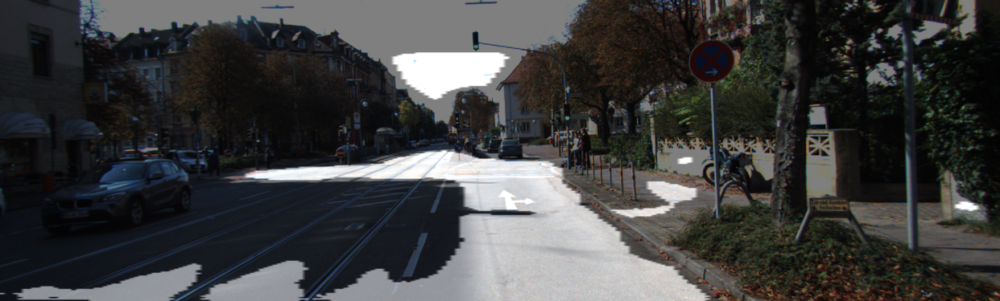

IoU : 0.419641


0.41964089410040306

In [52]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output(
     unet_model, # unet 모델
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

### U-Net++ 모델 결과

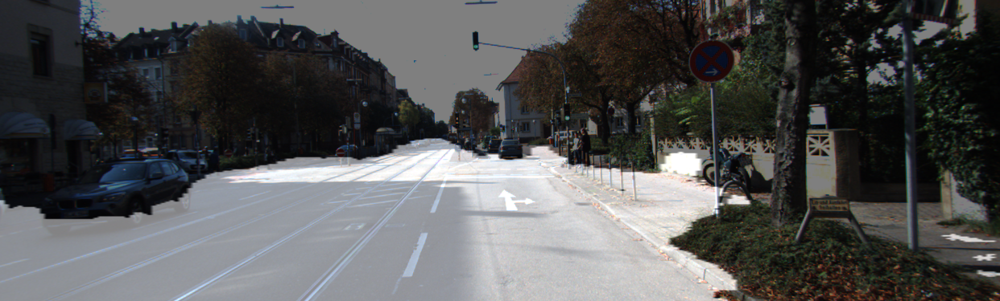

IoU : 0.831964


0.8319642505092988

In [53]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output(
     unet_2plus_best_model, # unet++ 모델
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

#### U-Net++ 모델의 IoU가 0.4 이상 향상 되었다.

### 추가 실험
- 5개 모델 이미지를 원본, Ground truth mask 이미지와 비교 할 수 있도록 시각화

In [54]:
def visualize_segmentation_results(model, preproc, image_path, y_true_path):
    """
    이미지와 Ground Truth, Prediction Mask를 시각화하고 IoU 점수를 계산합니다.
    
    Parameters:
        model (tf.keras.Model): 세그멘테이션 모델
        preproc (function): 이미지 전처리 함수
        image_path (str): 원본 이미지 경로
        y_true_path (str): Ground truth mask 이미지 경로
    """
    # -----------------------
    # 1. 예측 및 전처리
    # -----------------------
    output, prediction, target = get_output(
        model=model, 
        preproc=preproc, 
        image_path=image_path, 
        output_path=None, 
        label_path=y_true_path
    )
    
    # -----------------------
    # 2. IoU 점수 계산
    # -----------------------
    iou_score = calculate_iou_score(target, prediction)
    print(f"IoU Score: {iou_score:.4f}")
    
    # -----------------------
    # 3. 시각화
    # -----------------------
    origin_img = imread(image_path)
    
    plt.figure(figsize=(15, 5))
    
    # 원본 이미지
    plt.subplot(1, 3, 1)
    plt.title('Original Image')
    plt.imshow(origin_img)
    plt.axis('off')
    
    # Ground Truth 마스크
    plt.subplot(1, 3, 2)
    plt.title('Ground Truth')
    plt.imshow(target, cmap='gray')
    plt.axis('off')
    
    # 예측 마스크
    plt.subplot(1, 3, 3)
    plt.title(f'Predicted Mask\nIoU: {iou_score:.4f}')
    plt.imshow(prediction, cmap='gray')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

### UNet 모델 평가


Visualizing Image 1:


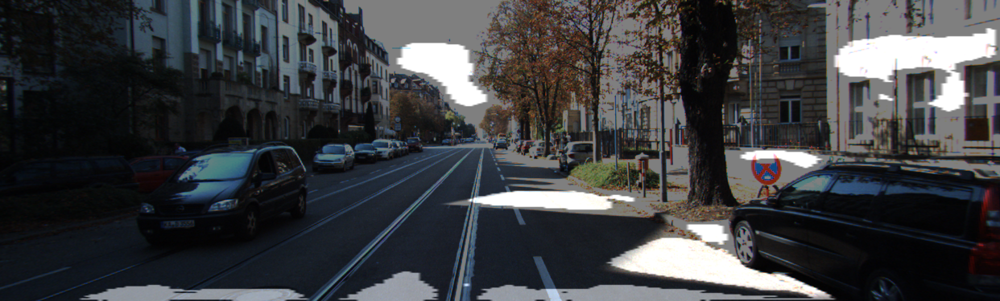

IoU : 0.169192
IoU Score: 0.1692


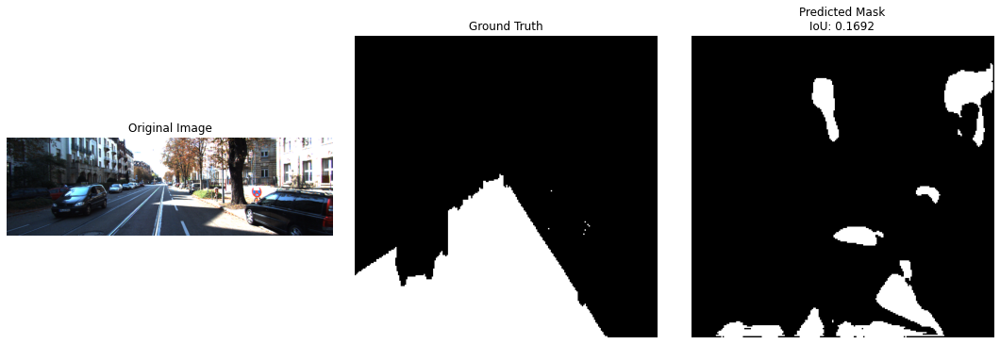


Visualizing Image 2:


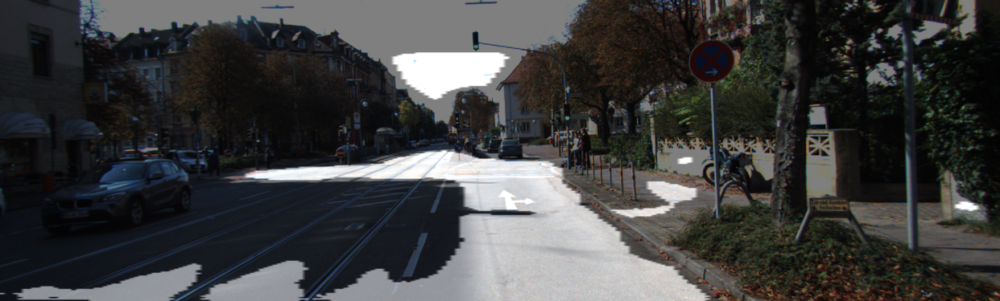

IoU : 0.419641
IoU Score: 0.4196


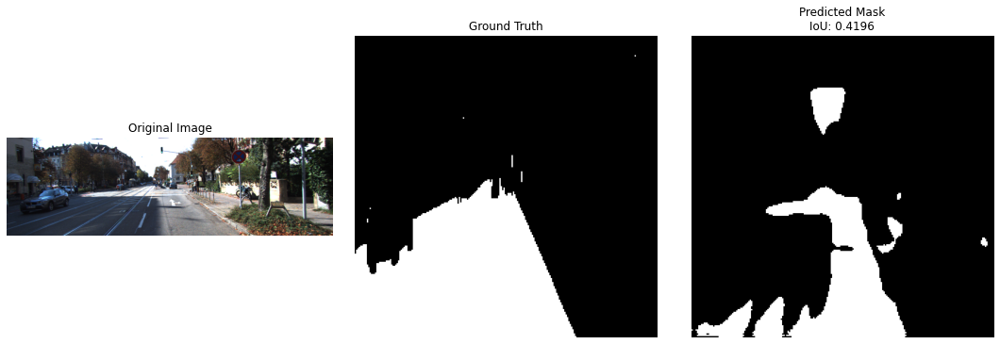


Visualizing Image 3:


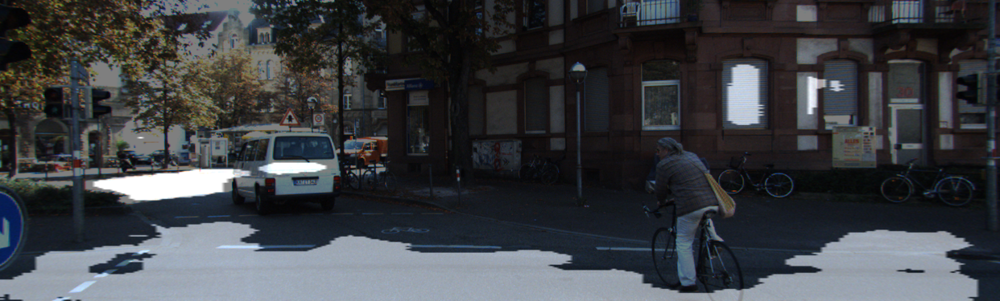

IoU : 0.584087
IoU Score: 0.5841


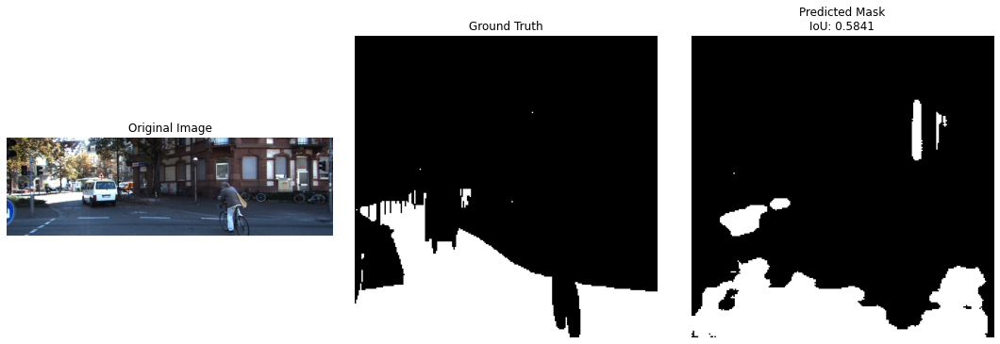


Visualizing Image 4:


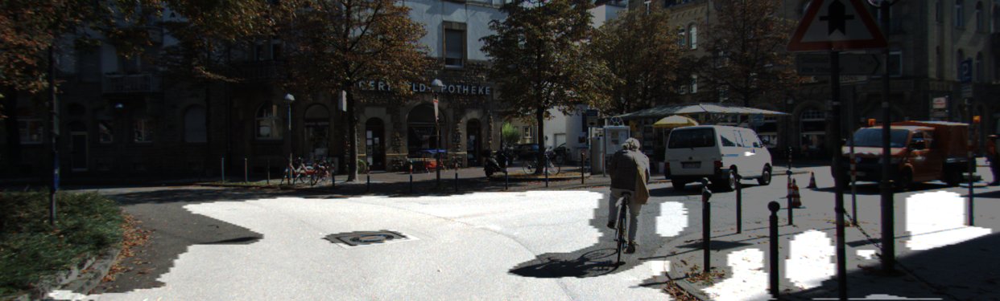

IoU : 0.571212
IoU Score: 0.5712


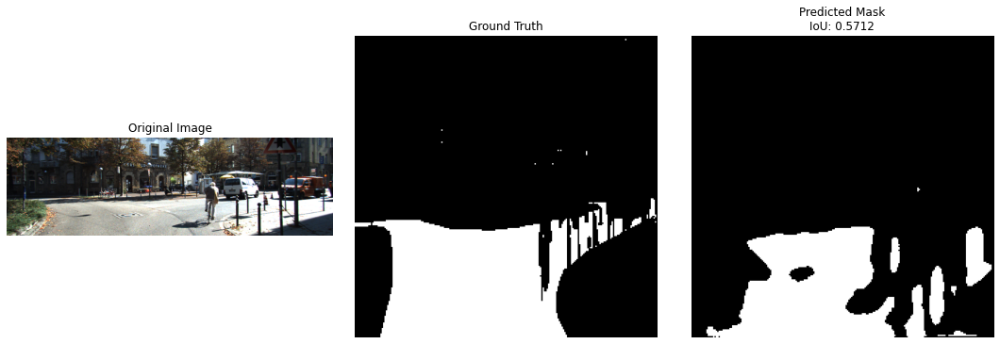


Visualizing Image 5:


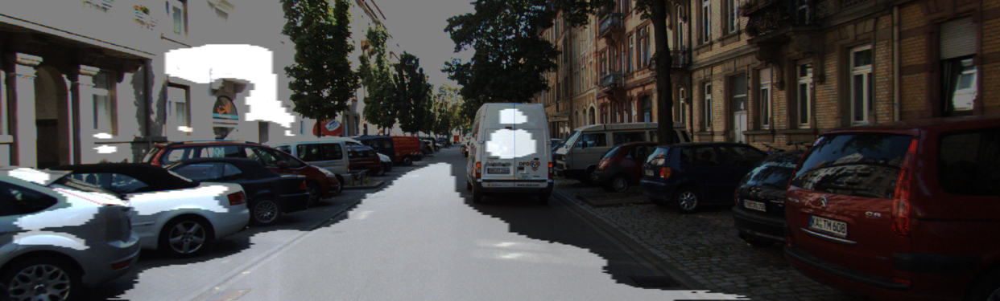

IoU : 0.560296
IoU Score: 0.5603


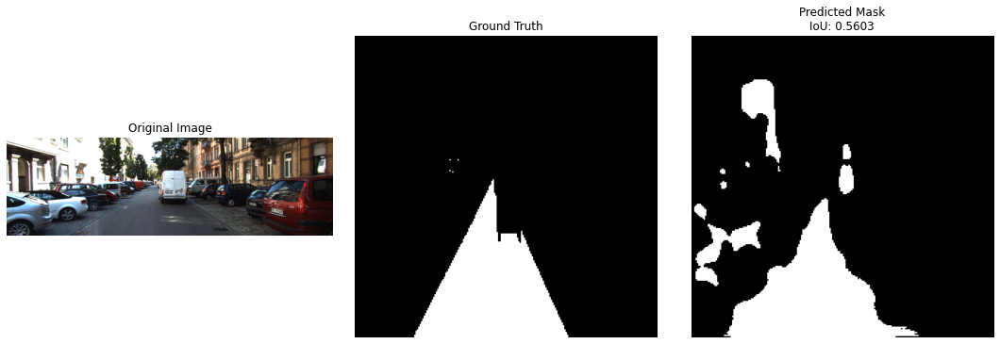

In [55]:
# 여러 이미지에 대해 시맨틱 세그멘테이션 결과 시각화 및 IoU 계산
for i in range(5):  # 5개의 이미지를 시각화
    image_path = os.path.join(dir_path, 'image_2', f'00{str(i).zfill(4)}_10.png')
    y_true_path = os.path.join(dir_path, 'semantic', f'00{str(i).zfill(4)}_10.png')
    
    print(f"\nVisualizing Image {i+1}:")
    visualize_segmentation_results(
        model=unet_model,  # U-Net 모델
        preproc=augmentation_test,  # 전처리 함수
        image_path=image_path,
        y_true_path=y_true_path
    )

### U-Net++ 모델 평가


Visualizing Image 1:


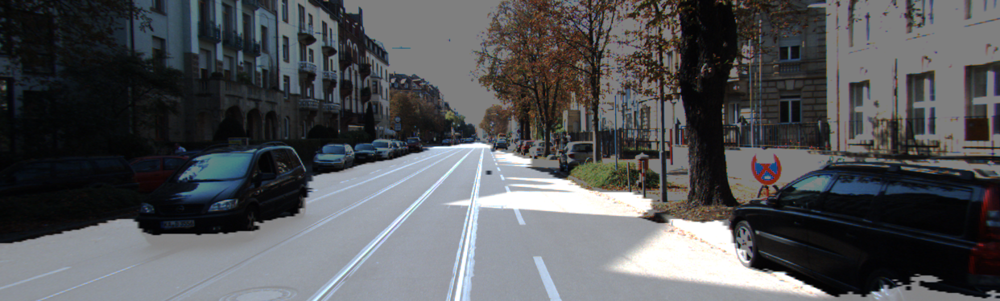

IoU : 0.911615
IoU Score: 0.9116


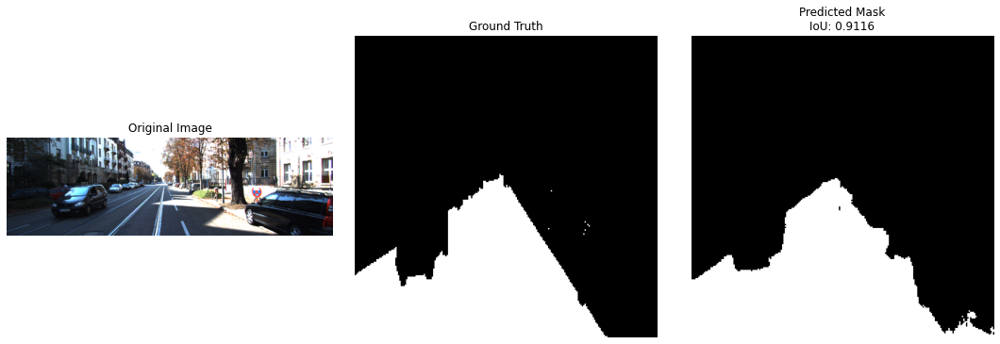


Visualizing Image 2:


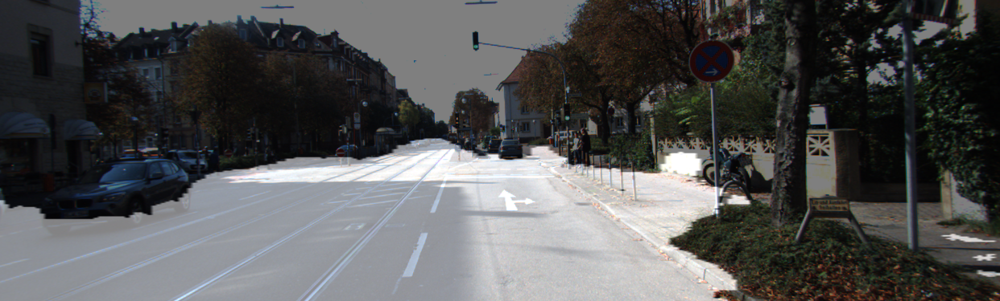

IoU : 0.831964
IoU Score: 0.8320


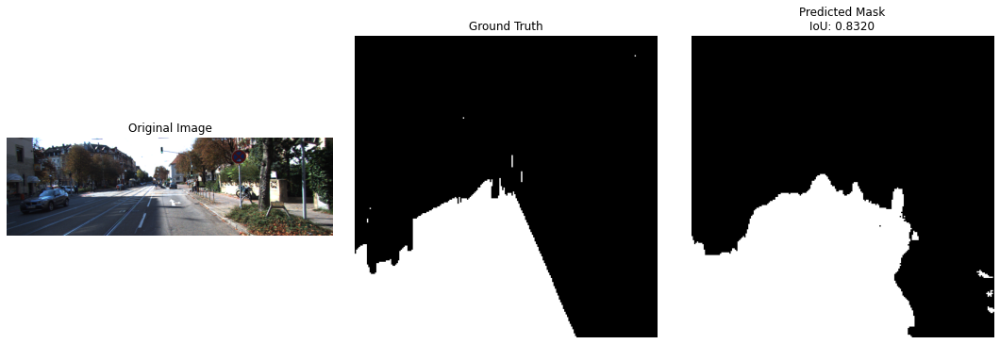


Visualizing Image 3:


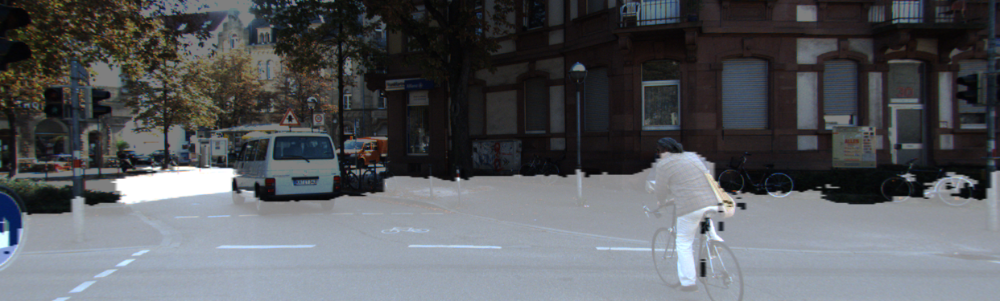

IoU : 0.583265
IoU Score: 0.5833


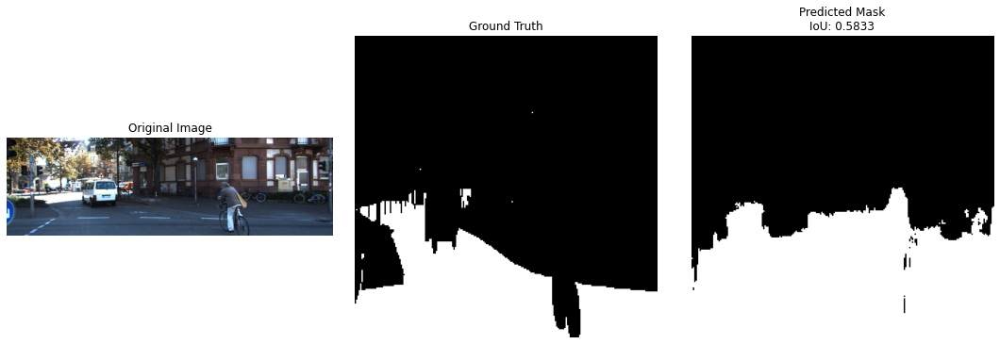


Visualizing Image 4:


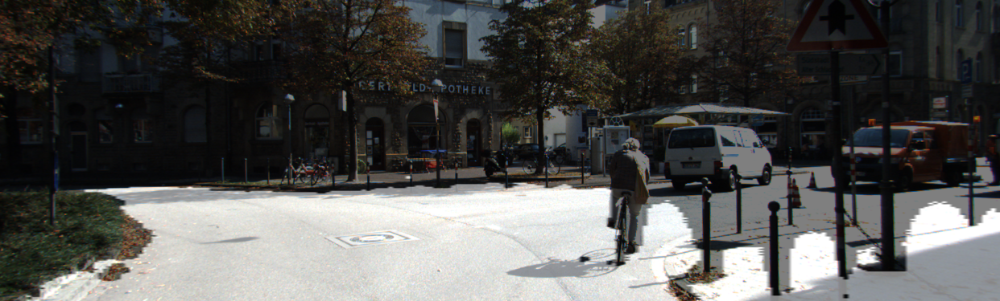

IoU : 0.662284
IoU Score: 0.6623


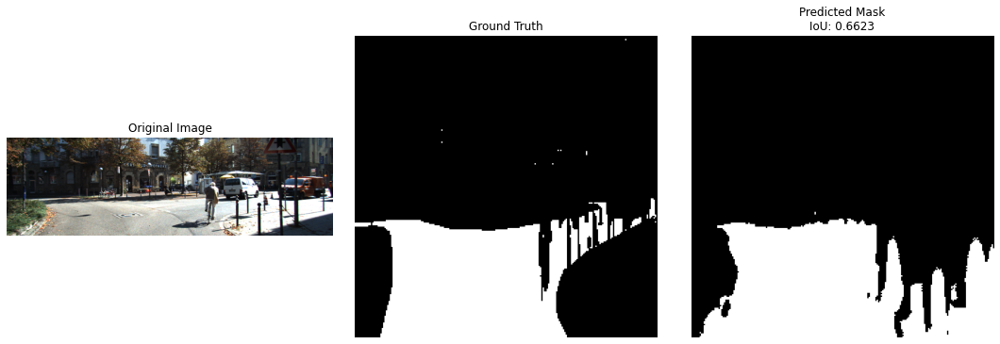


Visualizing Image 5:


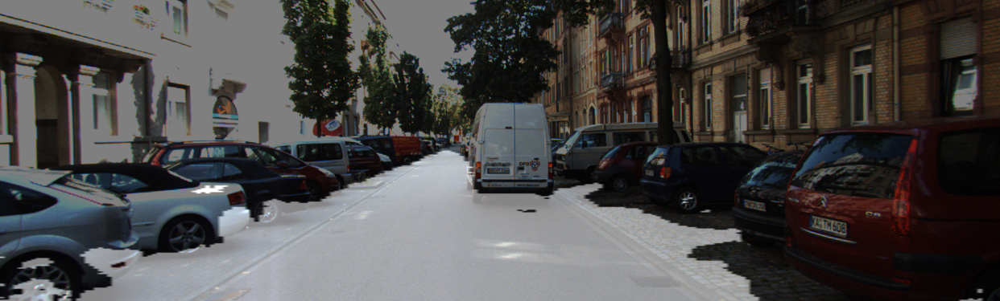

IoU : 0.623379
IoU Score: 0.6234


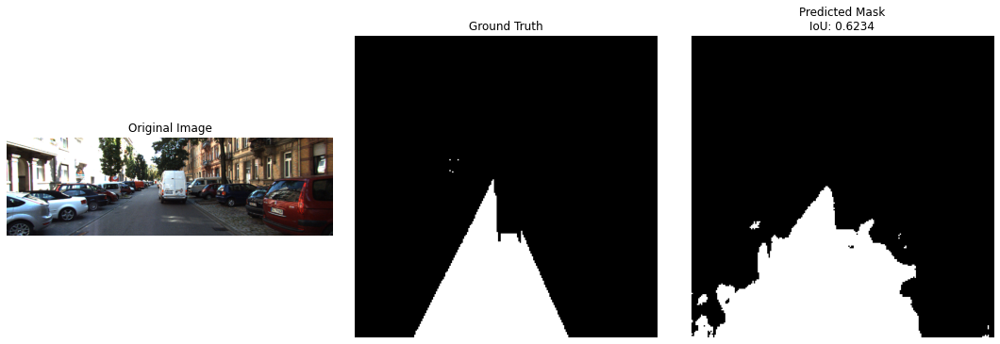

In [56]:
# 여러 이미지에 대해 시맨틱 세그멘테이션 결과 시각화 및 IoU 계산
for i in range(5):  # 5개의 이미지를 시각화
    image_path = os.path.join(dir_path, 'image_2', f'00{str(i).zfill(4)}_10.png')
    y_true_path = os.path.join(dir_path, 'semantic', f'00{str(i).zfill(4)}_10.png')
    
    print(f"\nVisualizing Image {i+1}:")
    visualize_segmentation_results(
        model=unet_2plus_best_model,  # U-Net 모델
        preproc=augmentation_test,  # 전처리 함수
        image_path=image_path,
        y_true_path=y_true_path
    )

### 회고
- U-Net 에 비해 U-Net++ 의 성능이 훨씬 좋았졌음을 볼 수 있었다.
- U-Net++ 의 xnet 부분을 보면서 skip connection 이 참 다양하게 여러가지로 중요하게 쓰이는걸 알 수 있었다.
- 도로의 경계면을 잘 구분하지 못하는 문제점이 보인다.
- Visualizing Image 1 을 보면 그림자 부분을 도로의 경계면으로 판단해 버리는 증상을 볼 수 있다.

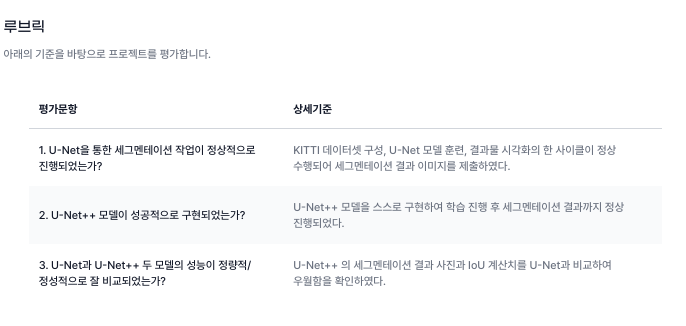